# Import

In [1]:
from tqdm import tqdm
import seaborn as sns
import matplotlib.pyplot as plt

from src.config import *
from src.models.model_util import *
from src.data.data_util import *
from src.visualization.auggrad import *
from src.visualization.cams import *
from src.visualization.visual_utils import *
from src.visualization.vistool_pipeline import *

from IPython.display import clear_output

In [2]:
# LOAD CONFIG
cfg = load_config()

# MODEL CONFIG

### MODEL -- RESNET_NO_MAXPOOL / 64/128/256/512 / 2021_04_07_1408_resnet_no_maxpool
# cfg.model_name = 'resnet_no_maxpool'
# cfg.start_channels = 64
# model, cfg.device = load_model(cfg.model_name, verbose=False, cfg=cfg)
# model.load_state_dict(torch.load('./result/models/2021_04_07_1408_resnet_no_maxpool/resnet_no_maxpool_ep70-100_sd42_mae6.241.pth/'))
###

### MODEL -- RESNET_NO_MAXPOOL / 16/32/64/128/ / 2021_04_15_1106_resnet_no_maxpool
# cfg.model_name = 'resnet_no_maxpool'
# model, cfg.device = load_model(cfg.model_name, verbose=False, cfg=cfg)
# model.load_state_dict(torch.load('./result/models/2021_04_15_1106_resnet_no_maxpool/best_resnet_no_maxpool_ep94-100_sd42_mae6.160.pth'))
###

### MODEL -- RESIDUAL(PAST) /
cfg.model_name = "vanilla_residual_past"
cfg.layers = [8, 16, 32, 64]
model, cfg.device = load_model(cfg.model_name, verbose=False, cfg=cfg)
model.load_state_dict(
    torch.load(
        "./result/models/2021_04_15_2357_vanilla_residual_past/best_vanilla_residual_past_ep24-100_sd42_mae6.828.pth"
    )
)
###

# Dataloader
# cfg.return_path = True
train_dataset = DatasetPlus(cfg, augment=False, test=True)
sample_dl = DataLoader(train_dataset, batch_size=1)

# FOR SINGLE BRAIN
# x, y = train_dataset[15]
# x = x[None, ...]

G:\My Drive\brain_data\workspace\3d_brain\src\config.py:17: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  return CFG(yaml.load(yml_config_file))


Model Vanilla_residual_past is selected.


In [3]:
gcam = VisTool(cfg, model, cam_type="gcam")
path = "./result/models/2021_04_15_2357_vanilla_residual_past/*.pth"
gcam.run_pretrains_dataloader(path, sample_dl, layer_index=8, visualize=False)

In [8]:
sgrad = VisTool(cfg, model, cam_type="sgrad")
path = "./result/models/2021_04_15_2357_vanilla_residual_past/*.pth"
sgrad.run_pretrains_dataloader(path, sample_dl, visualize=False, normalize=False)

In [ ]:
# agrad = VisTool(cfg, model, cam_type='agrad')
# path = './result/models/2021_04_07_1408_resnet_no_maxpool/*.pth'
# agrad.run_pretrains_dataloader(path, sample_dl, visualize=False)

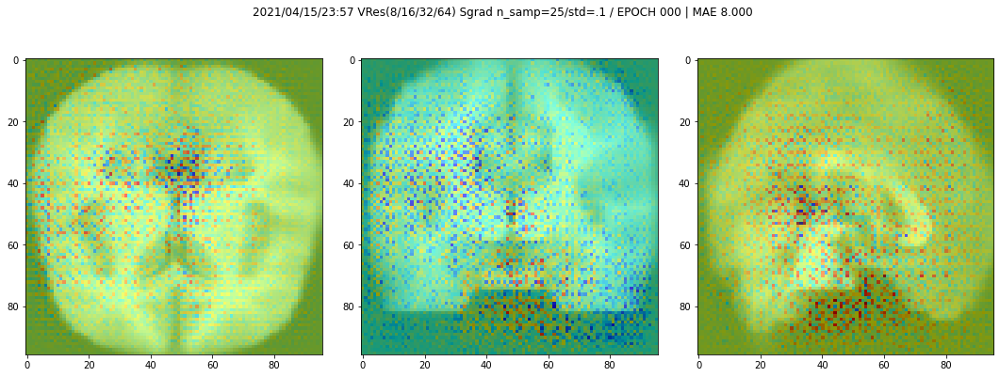

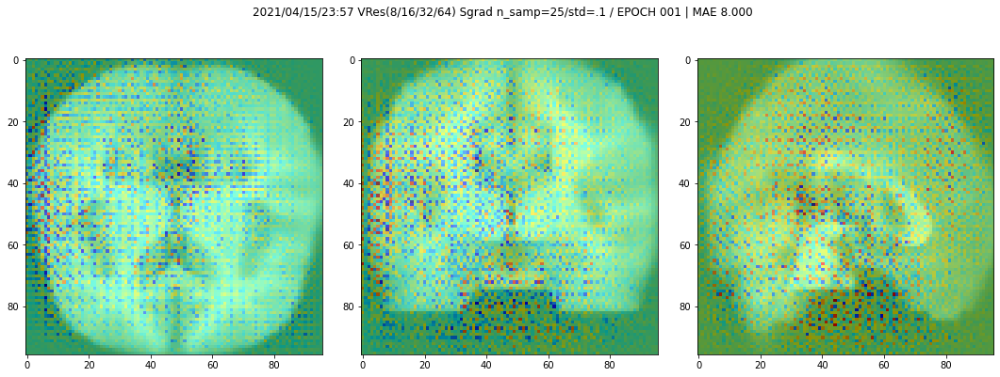

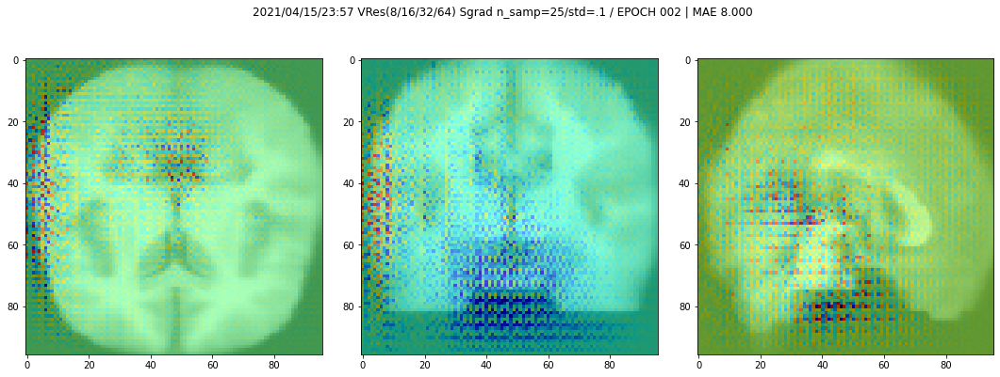

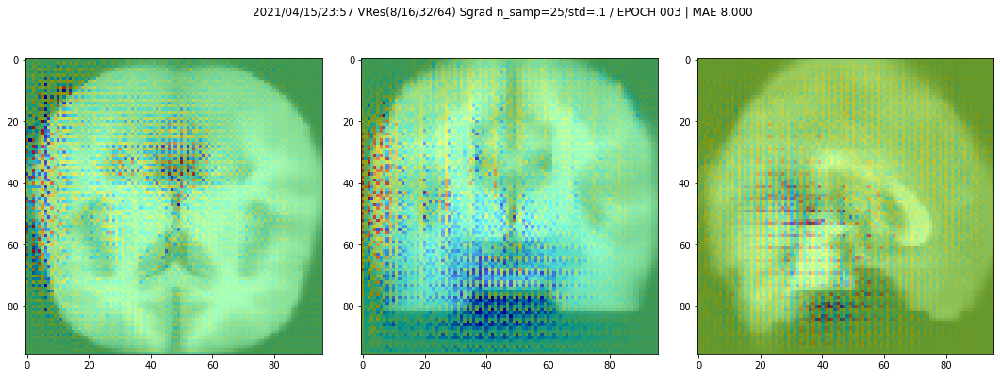

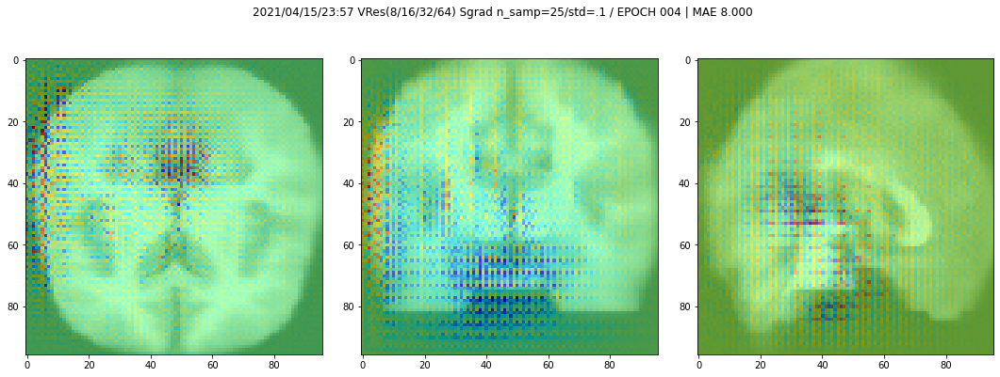

...

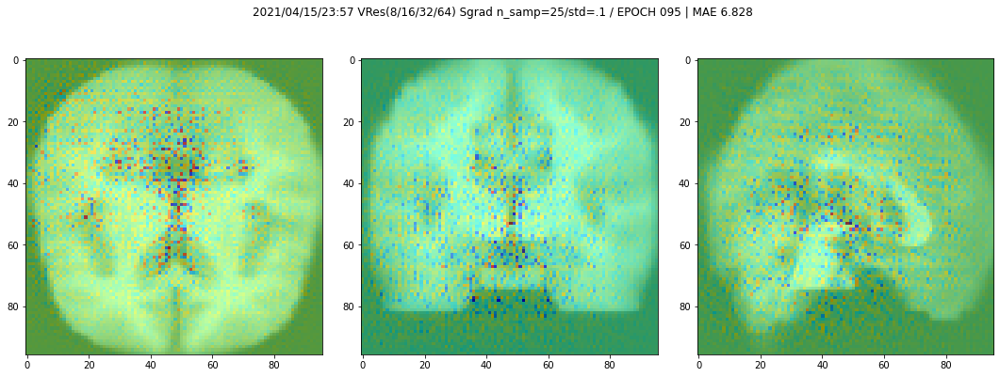

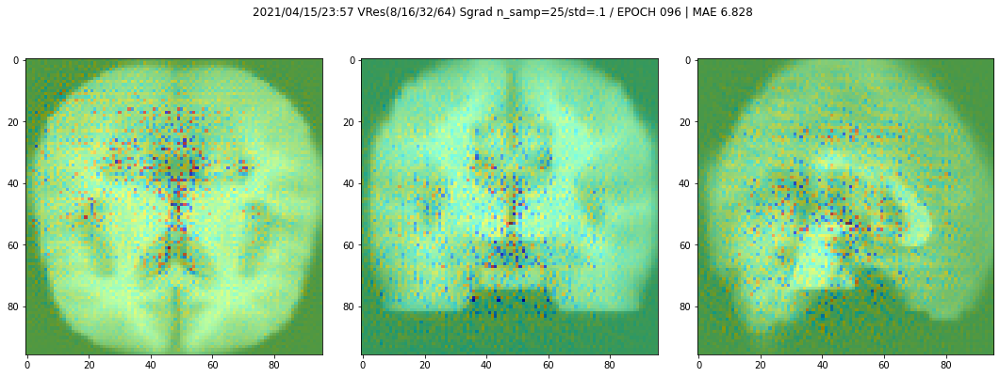

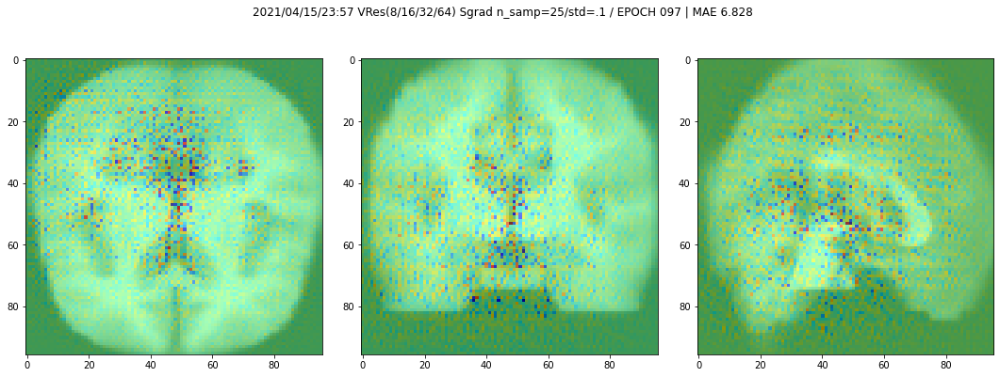

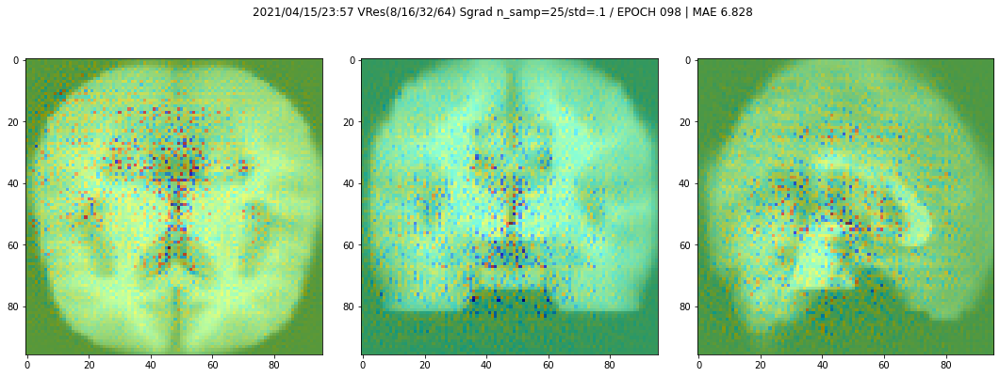

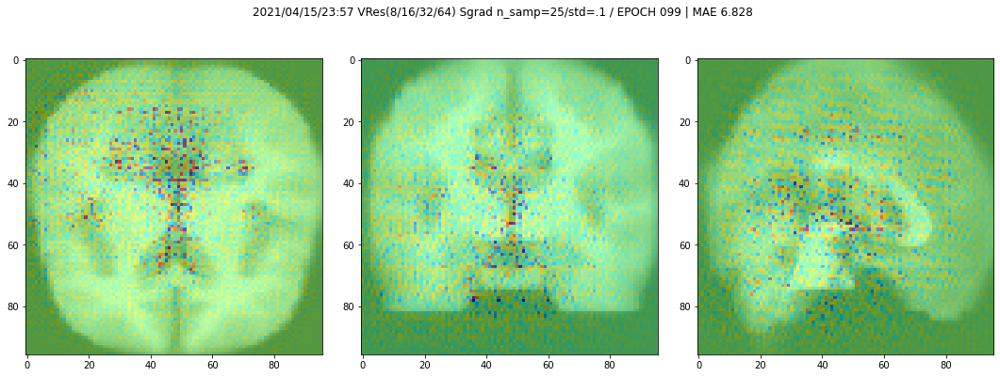

In [13]:
# make averaged_brain + vismap
averaged_brain = F.interpolate(
    torch.tensor(np.load("../../brainmask_tlrc/averaged_brain_no_oas3.npy"))[
        None, None, ...
    ],
    size=(96, 96, 96),
)
att_path = "./result/attention_maps/2021_04_15_2357_vanilla_residual_past_sgrad_layer8/"
for i, (v, info) in enumerate(
    zip(sgrad.vismap_ts, list(map(ep_mae_parser, glob(path))))
):
    plot_vismap(
        brain=averaged_brain,
        vismap=torch.tensor(v[0]),
        idx=i,
        title=f"2021/04/15/23:57 VRes(8/16/32/64) Sgrad n_samp=25/std=.1 / {info}",
        save=True,
        att_path=att_path,
    )

    np.save(f"{att_path}/{str(i).zfill(3)}.npy", v[0])

In [14]:
with imageio.get_writer(f"{att_path}/avg.gif", mode="I") as writer:
    for im in sorted(glob(f"{att_path}/*.png")):
        image = imageio.imread(im)
        writer.append_data(image)